In [1]:
# Automatically reload modules

%load_ext autoreload
# %autoreload # Reload all modules (except those excluded by %aimport) automatically now
# %autoreload 1  # Reload all modules imported with %aimport every time before executing the Python code typed
# %autoreload 2 # Reload all modules (except those excluded by %aimport) every time before executing the Python code typed

In [2]:
%autoreload

In [3]:
import numpy as np
from scipy import signal

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
sns.set_style('darkgrid')

In [4]:
import antarray

Text(0.5, 1.0, 'Array distribution')

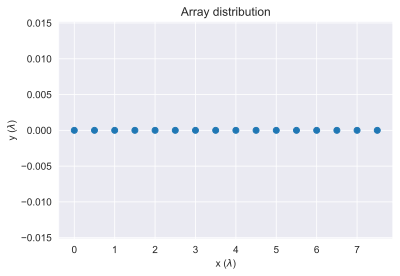

In [5]:
theta = np.arange(-90, 90, 0.1)
lin_array = antarray.LinearArray(16, 0.5)

plt.scatter(lin_array.x, lin_array.y)
plt.xlabel(r'x ($\lambda$)')
plt.ylabel(r'y ($\lambda$)')
plt.title('Array distribution')

Text(0.5, 1.0, 'Array factor')

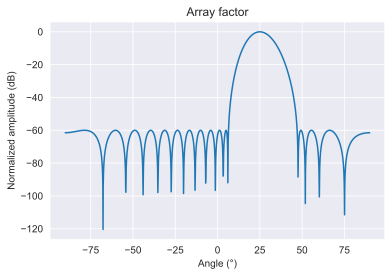

In [12]:
pattern = lin_array.get_pattern(theta, beam_loc=25, window='Chebyshev', sll=-60)
plt.plot(theta, 20*np.log10(np.abs(pattern['array_factor'])))
plt.xlabel('Angle (°)')
plt.ylabel('Normalized amplitude (dB)')
plt.title('Array factor')

In [13]:
theta = np.arange(-90, 91, 1)
phi = np.arange(-90, 91, 1)

loc=np.arange(0, 8, 0.5)
loc_x=np.tile(loc, 16)
loc_y=np.repeat(loc, 16)

ant_array = antarray.AntennaArray(loc_x, loc_y)

Text(0.5, 1.0, 'Array distribution')

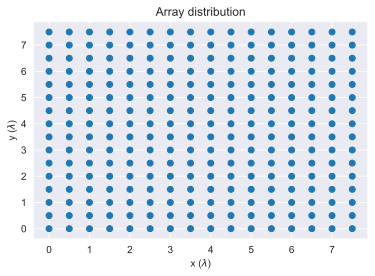

In [14]:
plt.scatter(loc_x, loc_y)
plt.xlabel(r'x ($\lambda$)')
plt.ylabel(r'y ($\lambda$)')
plt.title('Array distribution')

In [15]:
data=ant_array.get_pattern(theta, phi)

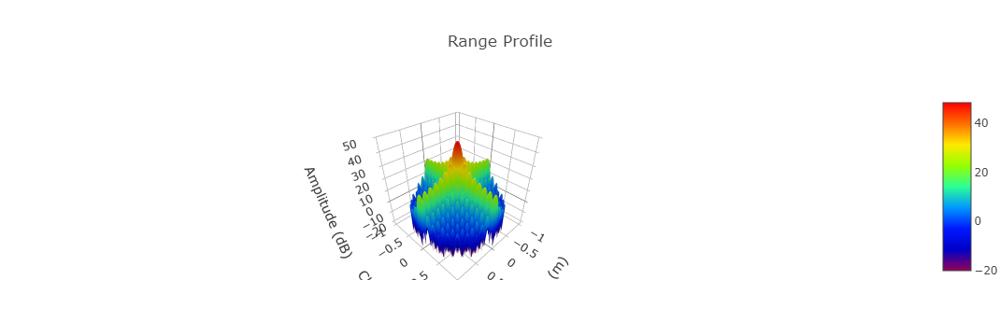

In [16]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
from plotly import tools

init_notebook_mode(connected=True)

temp = 20*np.log10(np.abs(data['array_factor'])+0.1)

range_axis = data['u']

doppler_axis = data['v']

data = [go.Surface(x=range_axis, y=doppler_axis, z=temp, colorscale='Rainbow')]

layout = go.Layout(
    title='Range Profile',
    height=800,
    scene=dict(
        xaxis=dict(title='Range (m)'),
        yaxis=dict(title='Chirp'),
        zaxis=dict(title='Amplitude (dB)'),
        aspectmode='cube',
    ),
    margin=dict(l=0, r=0, b=60, t=100),
    legend=dict(orientation='h'),
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='range_profile.html')

In [17]:
data=ant_array.get_pattern(np.arange(-1,1,0.01), np.arange(-1,1,0.01), polar=False)

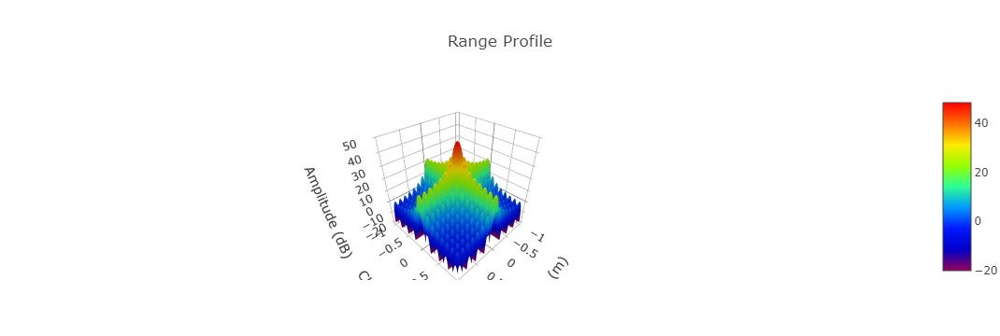

In [18]:
temp = 20*np.log10(np.abs(data['array_factor'])+0.1)

range_axis = np.arange(-1,1,0.01)

doppler_axis = np.arange(-1,1,0.01)

data = [go.Surface(x=data['u'], y=data['v'], z=temp, colorscale='Rainbow')]

layout = go.Layout(
    title='Range Profile',
    height=800,
    scene=dict(
        xaxis=dict(title='Range (m)'),
        yaxis=dict(title='Chirp'),
        zaxis=dict(title='Amplitude (dB)'),
        aspectmode='cube',
    ),
    margin=dict(l=0, r=0, b=60, t=100),
    legend=dict(orientation='h'),
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='range_profile.html')

In [2]:
import matplotlib.cm as cm
import nu
np.array(cm.get_cmap('jet'))

NameError: name 'np' is not defined